                                                   Labaratoriska vezba 4
                                                    
                                                    
Klasifikacija na crno-beli pixeli kako edna od bukvite vo Angliskata azbuka (od A-Z). Podatocnoto mnozestvo sodrzi 20000 unique primeroci dobieni so iskrivuvanje na bukvite od slikite vo ramkite na 20 razlicni fontovi. 

Pritoa se generiraat 16 karakteristiki koi se skalirani i dovedeni vo integer format od 0 do 15.

In [1]:
#Importiranje na potrebnite biblioteki
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import pandas as pd
import numpy as np 
from scipy import stats 
from sklearn import datasets 
from sklearn.naive_bayes import GaussianNB 
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, classification_report, precision_score
from sklearn.model_selection import train_test_split
%matplotlib notebook
import warnings
warnings.filterwarnings("ignore")
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

### Importiranje, reprezentacija i podelba na dataset-ot

In [2]:
#Importiranje na dataset-ot

column_names = np.loadtxt(open(r"C:\Users\private\Downloads\letter-recognition.csv", "rb"), delimiter=",", max_rows=1, dtype = str)
data = np.loadtxt(open(r"C:\Users\private\Downloads\letter-recognition.csv", "rb"), delimiter=",", skiprows=1, dtype = str) 

d = pd.read_csv(r"C:\Users\private\Downloads\letter-recognition.csv")
d.head() #gi pretstavuvam prvite nekolku primeroci od podatocnoto mnozestvo

,letter,xbox,ybox,width,height,onpix,xbar,ybar,x2bar,y2bar,xybar,x2ybar,xy2bar,xedge,xedgey,yedge,yedgex
0,T,2,8,3,5,1,8,13,0,6,6,10,8,0,8,0,8
1,I,5,12,3,7,2,10,5,5,4,13,3,9,2,8,4,10
2,D,4,11,6,8,6,10,6,2,6,10,3,7,3,7,3,9
3,N,7,11,6,6,3,5,9,4,6,4,4,10,6,10,2,8
4,G,2,1,3,1,1,8,6,6,6,6,5,9,1,7,5,10


Bidejki podatocite za primerocite se veke vo rang od 0 do 15 ne e potrebno dopolnitelna normalizacija.

In [3]:
d.info()
#informacii za dataset-ot kako broj na redici i koloni, podatocen tip za vrednostite od sekoja kolona, broj na nenulti podatoci za sekoja kolona (kako sto gledame podatocnoto mnozestvo ne sodrzi nulti podatoci) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   letter  20000 non-null  object
 1   xbox    20000 non-null  int64 
 2   ybox    20000 non-null  int64 
 3   width   20000 non-null  int64 
 4   height  20000 non-null  int64 
 5   onpix   20000 non-null  int64 
 6   xbar    20000 non-null  int64 
 7   ybar    20000 non-null  int64 
 8   x2bar   20000 non-null  int64 
 9   y2bar   20000 non-null  int64 
 10  xybar   20000 non-null  int64 
 11  x2ybar  20000 non-null  int64 
 12  xy2bar  20000 non-null  int64 
 13  xedge   20000 non-null  int64 
 14  xedgey  20000 non-null  int64 
 15  yedge   20000 non-null  int64 
 16  yedgex  20000 non-null  int64 
dtypes: int64(16), object(1)
memory usage: 2.6+ MB


In [4]:
X = data[:,1:].astype(np.int) #X matricata se odnesuva na vleznite labelirani primeroci taka sto sekoj red pretstavuva eden primerok od mnozestvoto a sekoja kolona pretstavuva eden feature
y = data[:,0] #y vektorot se odnesuva na labeliranite izlezi, za sekoj primerok pooddelno

number_of_features = X.shape[1]
number_of_classes = len(np.unique(y))

print(X)
print(y)

[[ 2  8  3 ...  8  0  8]
 [ 5 12  3 ...  8  4 10]
 [ 4 11  6 ...  7  3  9]
 ...
 [ 6  9  6 ... 12  2  4]
 [ 2  3  4 ...  9  5  8]
 [ 4  9  6 ...  7  2  8]]
['T' 'I' 'D' ... 'T' 'S' 'A']


In [5]:
target_names = ["A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y","Z"]
feature_names = column_names[1:]

number_of_features = X.shape[1]
number_of_classes = len(np.unique(y))

print("Broj na izlezni klasi i naziv:", len(np.unique(y)), target_names) #Vrakja kolku izlezni klasi imame vo ramkite na problemot i koi se nivnite imenuvanja
print("Broj i iminja na features:", X.shape[1], feature_names) #Features za dataset-ot ednakvi na kolonite na X matricata
print("Broj na primeroci:", X.shape[0]) #Broj na primeroci kolku sto ima redici vo X matricata

Broj na izlezni klasi i naziv: 26 ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
Broj i iminja na features: 16 ['xbox ' 'ybox ' 'width ' 'height' 'onpix ' 'xbar ' 'ybar ' 'x2bar'
 'y2bar ' 'xybar ' 'x2ybar' 'xy2bar' 'xedge ' 'xedgey' 'yedge ' 'yedgex']
Broj na primeroci: 20000


In [6]:
# Split na mnozestvoto na train-test set
X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.7,test_size=0.3,random_state=101)

### Vizuelizacija

<IPython.core.display.Javascript object>


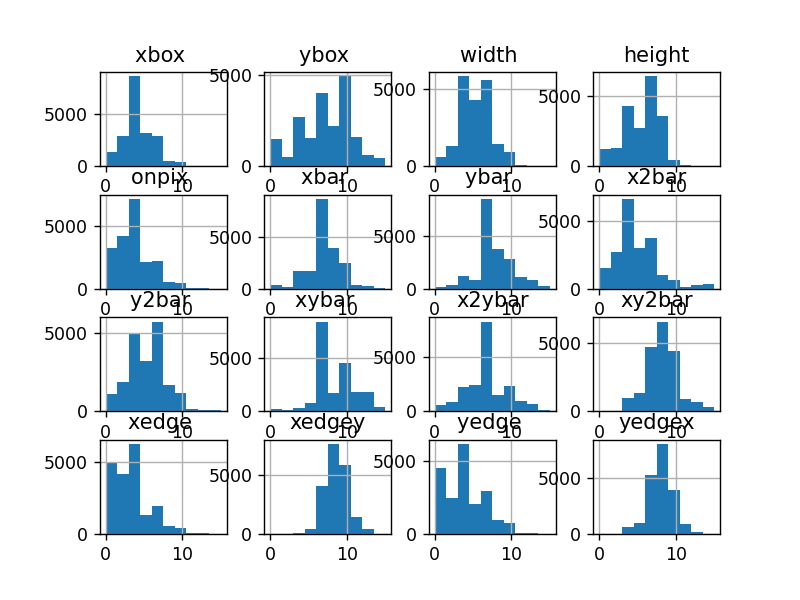

array([[<AxesSubplot:title={'center':'xbox '}>,
        <AxesSubplot:title={'center':'ybox '}>,
        <AxesSubplot:title={'center':'width '}>,
        <AxesSubplot:title={'center':'height'}>],
       [<AxesSubplot:title={'center':'onpix '}>,
        <AxesSubplot:title={'center':'xbar '}>,
        <AxesSubplot:title={'center':'ybar '}>,
        <AxesSubplot:title={'center':'x2bar'}>],
       [<AxesSubplot:title={'center':'y2bar '}>,
        <AxesSubplot:title={'center':'xybar '}>,
        <AxesSubplot:title={'center':'x2ybar'}>,
        <AxesSubplot:title={'center':'xy2bar'}>],
       [<AxesSubplot:title={'center':'xedge '}>,
        <AxesSubplot:title={'center':'xedgey'}>,
        <AxesSubplot:title={'center':'yedge '}>,
        <AxesSubplot:title={'center':'yedgex'}>]], dtype=object)

In [7]:
#plot histograms za sekoja karakteristika (kolona)
d.hist()

<IPython.core.display.Javascript object>


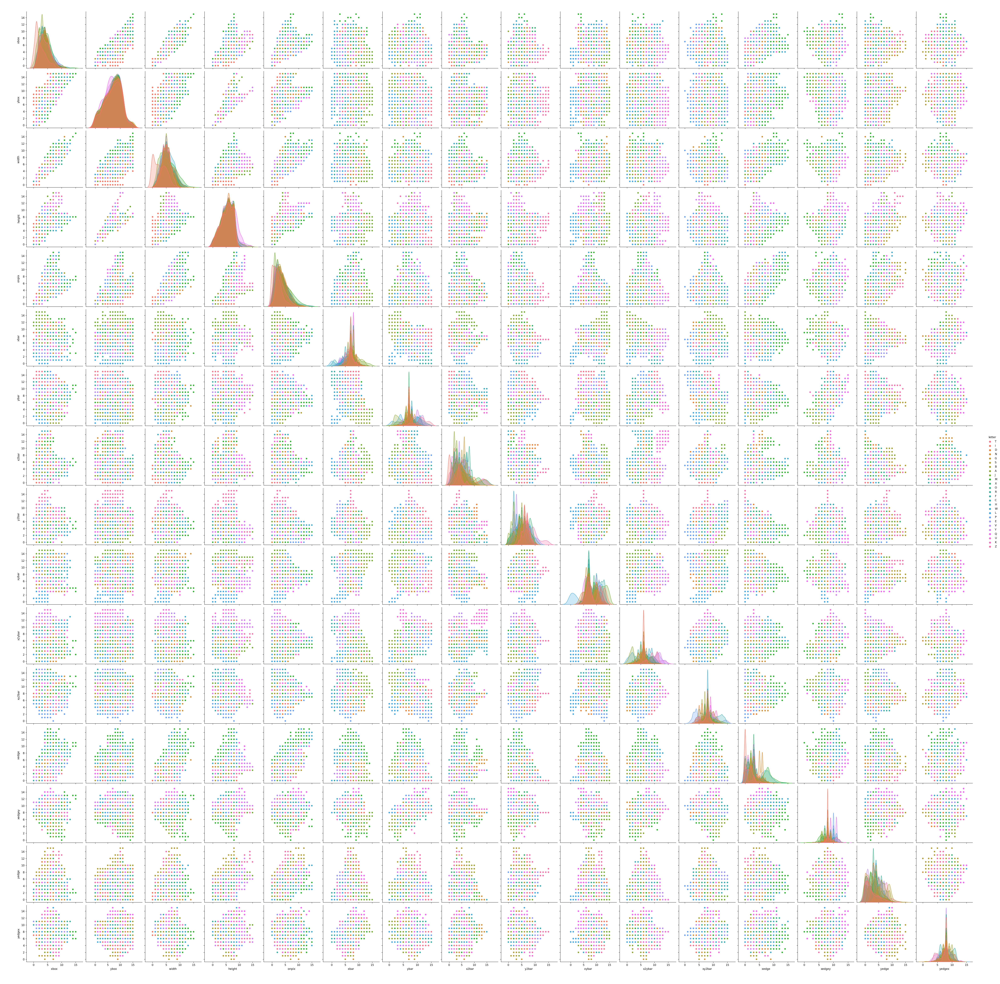

In [15]:
sns.pairplot(d,hue='letter') #pretstavuvanje na zavisnosta na karakteristikite vo parovi
plt.show()


<IPython.core.display.Javascript object>


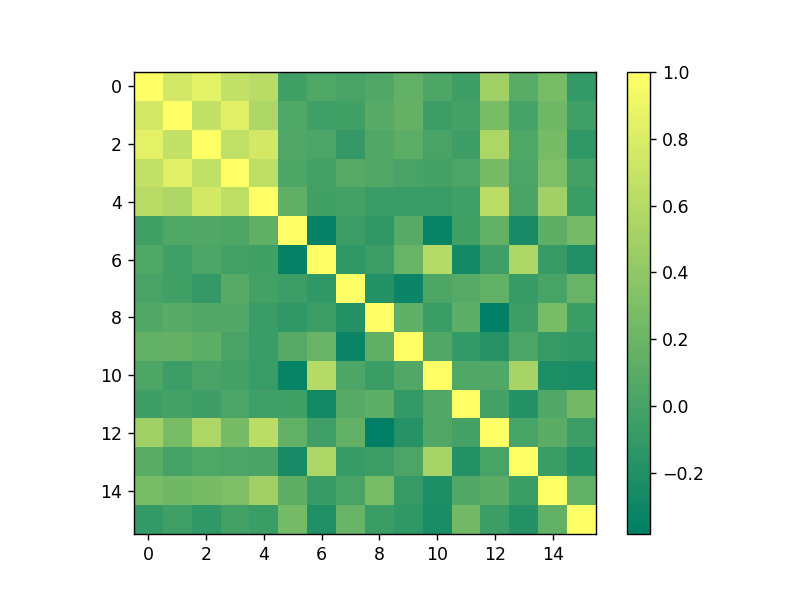

,xbox,ybox,width,height,onpix,xbar,ybar,x2bar,y2bar,xybar,x2ybar,xy2bar,xedge,xedgey,yedge,yedgex
xbox,1.000000,0.757793,0.851514,0.672764,0.619097,-0.032595,0.045545,0.014306,0.052086,0.148056,0.035464,-0.046333,0.489155,0.098180,0.273504,-0.105147
ybox,0.757793,1.000000,0.671912,0.823207,0.555067,0.045690,-0.040925,-0.025019,0.096478,0.159954,-0.054648,-0.007568,0.274431,-0.001336,0.230883,-0.042741
width,0.851514,0.671912,1.000000,0.660215,0.765716,0.061959,0.024832,-0.098611,0.057074,0.115018,0.011694,-0.045009,0.557251,0.045658,0.260285,-0.118273
height,0.672764,0.823207,0.660215,1.000000,0.644366,0.042844,-0.020072,0.082383,0.059032,0.012458,-0.011991,0.026386,0.265243,0.025359,0.297545,-0.018853
onpix,0.619097,0.555067,0.765716,0.644366,1.000000,0.139159,-0.028822,-0.011985,-0.065557,-0.069776,-0.072941,-0.038858,0.627507,0.017649,0.492653,-0.062969
xbar,-0.032595,0.045690,0.061959,0.042844,0.139159,1.000000,-0.356580,-0.053306,-0.122851,0.085963,-0.341957,-0.032115,0.144325,-0.253339,0.127056,0.248816
ybar,0.045545,-0.040925,0.024832,-0.020072,-0.028822,-0.356580,1.000000,-0.118625,-0.049658,0.178318,0.600397,-0.271649,-0.036722,0.555060,-0.078008,-0.207900
x2bar,0.014306,-0.025019,-0.098611,0.082383,-0.011985,-0.053306,-0.118625,1.000000,-0.188431,-0.317780,0.042545,0.082020,0.142132,-0.084820,0.006546,0.182902
y2bar,0.052086,0.096478,0.057074,0.059032,-0.065557,-0.122851,-0.049658,-0.188431,1.000000,0.132000,-0.060116,0.119048,-0.384018,-0.052545,0.277540,-0.061335
xybar,0.148056,0.159954,0.115018,0.012458,-0.069776,0.085963,0.178318,-0.317780,0.132000,1.000000,0.057988,-0.106759,-0.175676,0.029419,-0.087019,-0.114223


In [8]:
correlation_matrix = np.zeros((number_of_features,number_of_features))
for i in range(number_of_features): #Matricata na korelacija ke bidi od red 16x16, pri sto za sekoj par karakteristiki ja prikazuvame zavisnosta preku koeficientot na korelacija
    measure = X[:,i]
    for j in range(number_of_features):
        measure2 = X[:,j]
        corr, _ = stats.pearsonr(measure, measure2)
        correlation_matrix[i][j] = corr
plt.figure()
plt.imshow(correlation_matrix, cmap = "summer") 
plt.colorbar()
plt.show()

#istoto mozeme da go pretstavime i numericki vo tabela
d.corr()

### Feature selection i extraction

Od plotot za korelacija zabelezuvame visoka korelacia imame pomegju xbox so ybox i width taka sto bi probale da napravime drop na ovie dve koloni i potoa so random forest classifier da presmetame accuracy.

In [9]:
drop_list1 = ['ybox ','width ']
list = ['letter']
x = d.drop(list,axis = 1 )
X_1 = x.drop(drop_list1,axis = 1 )        
X_1.head()

,xbox,height,onpix,xbar,ybar,x2bar,y2bar,xybar,x2ybar,xy2bar,xedge,xedgey,yedge,yedgex
0,2,5,1,8,13,0,6,6,10,8,0,8,0,8
1,5,7,2,10,5,5,4,13,3,9,2,8,4,10
2,4,8,6,10,6,2,6,10,3,7,3,7,3,9
3,7,6,3,5,9,4,6,4,4,10,6,10,2,8
4,2,1,1,8,6,6,6,6,5,9,1,7,5,10


In [10]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Soodvetno go delime novoto podatocno mnozestvo X_1 na train-test set
X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y, test_size=0.3, random_state=42)

#Presmetuvanje na accuracy so random forest classifier i n_estimators=10 (default-no)
clf_rf = RandomForestClassifier(random_state=43)      
clr_rf = clf_rf.fit(X_1_train,y_1_train)

ac = accuracy_score(y_1_test,clf_rf.predict(X_1_test))
print('Accuracy is: ',ac)

Accuracy is:  0.9576666666666667


Dobivme prilicno dobar rezultat, odnosno 0.96 sto znaci deka i so ispustanjeto na dvete karakteristiki pravime samo nekolku pogresni predikcii.

In [11]:
from sklearn.feature_selection import RFE
#Recursive feature elimination (RFE) so random forest klasifikator koj izbira 10 najdobri karakteristiki a ostanatite gi krati rekurzivno
clf_rf_3 = RandomForestClassifier()      
rfe = RFE(estimator=clf_rf_3, n_features_to_select=10, step=1)
rfe = rfe.fit(X_train, y_train)
print('Chosen best 5 feature by rfe:',feature_names[rfe.support_])

Chosen best 5 feature by rfe: ['ybar ' 'x2bar' 'y2bar ' 'xybar ' 'x2ybar' 'xy2bar' 'xedge ' 'xedgey'
 'yedge ' 'yedgex']


Presmetuvame accuracy i so novoto podatocno mnozestvo, so izbranite 10 karakteristiki pri sto dobivame skoro slicna vrednost na preciznost odnosno 0.95. 

In [12]:
drop_list1 = ['xbox ', 'ybox ', 'width ', 'height', 'onpix ', 'xbar ']
list = ['letter']
x = d.drop(list,axis = 1 )
X_1 = x.drop(drop_list1,axis = 1 )        
X_1.head()
# Soodvetno go delime novoto podatocno mnozestvo X_1 na train-test set
X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y, test_size=0.3, random_state=42)

#Presmetuvanje na accuracy so random forest classifier i n_estimators=10 (default-no)
clf_rf = RandomForestClassifier(random_state=43)      
clr_rf = clf_rf.fit(X_1_train,y_1_train)

ac = accuracy_score(y_1_test,clf_rf.predict(X_1_test))
print('Accuracy is: ',ac)

Accuracy is:  0.9531666666666667


<IPython.core.display.Javascript object>


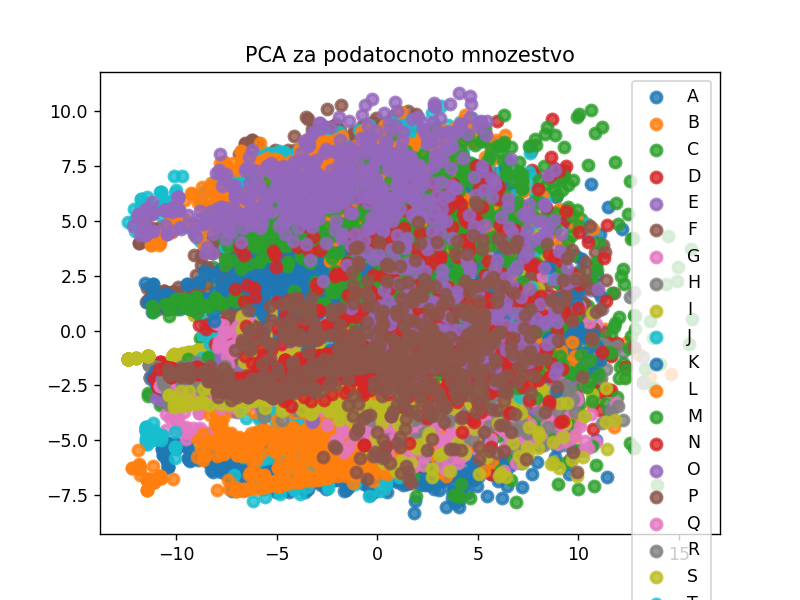

In [13]:
pca = PCA(n_components=16) 
X_PCA = pca.fit(X).transform(X)  

plt.figure() 
for i, target_name in zip(target_names, target_names):
    plt.scatter(X_PCA[y == i, 0], X_PCA[y == i, 1], alpha=.8, lw=2,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA za podatocnoto mnozestvo')
plt.show()

<IPython.core.display.Javascript object>


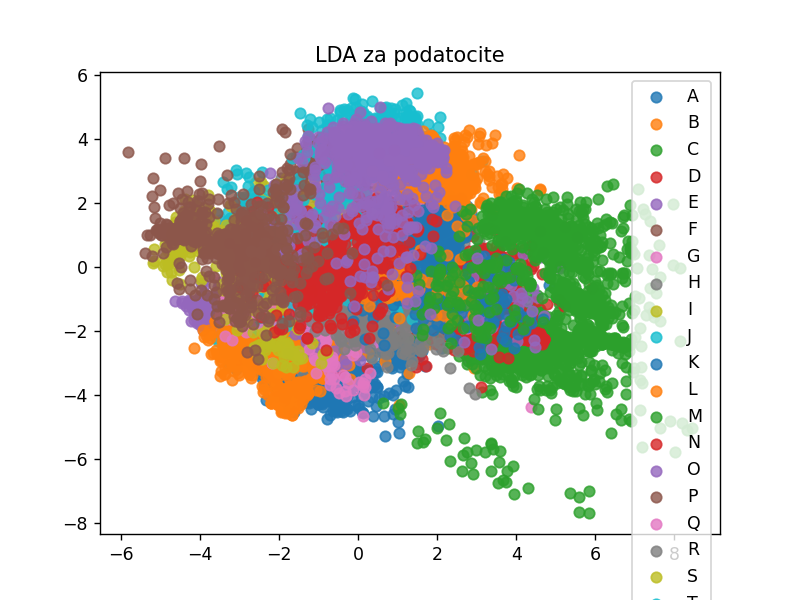

Text(0.5, 1.0, 'LDA za podatocite')

In [14]:
lda = LinearDiscriminantAnalysis(n_components=16) #brojot na komponenti e min(n_features, n_classes - 1)
X_LDA = lda.fit(X, y).transform(X)  

#Pri fituvanje na LDA modelot osven X matricata go naveduvame i y vektorot bidejki pretstavuva supervised (nadgleduvan) metod (dadeni ni se rezultatite)
plt.figure() 
for i, target_name in zip(target_names, target_names):
    plt.scatter(X_LDA[y == i, 0],X_LDA[y == i, 1], alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('LDA za podatocite')

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42) #Go delime podatocnoto m-vo na train set i test set vo soodnos 70:30% za X i za y i koristime random state za sekogas isto da se deli m-voto
X_PCA_train, X_PCA_test, y_PCA_train, y_PCA_test = train_test_split(X_PCA, y, test_size=0.30, random_state=42) #Soodvetno istoto go pravime za PCA dataset-ot
X_LDA_train, X_LDA_test, y_LDA_train, y_LDA_test = train_test_split(X_LDA, y, test_size=0.30, random_state=42) #Isto taka i za LDA dataset-ot


In [17]:
#Naive Bayes model
gnb = GaussianNB() 
gnb.fit(X_train, y_train) #pravime inicijalizacija i fituvanje na modelot za train-setot
y_pred = gnb.predict(X_test) #pravime predikcija za test mnozestvoto
accuracy = np.round(np.sum(y_test == y_pred)/len(y_test),3) #se presmetuva accuracy za modelot spored toa kolku primeroci od test setot sme pogodile podeleno so vkupniot broj primeroci od test setot zaokruzeno na 3 decimali
print("Tocnosta so Naive Bayes modelot za originalniot dataset e:", accuracy)

precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall,"\n")

#Isto kako i prethodno, prvo pravime inicijalizacija na Naive Bayes modelot,pa go fit-uvame na PCA training mnozestvoto i na kraj pravime predikcija za PCA test mnozestvoto so dopolnitelno presmetuvanje na accuracy
gnb = GaussianNB() 
gnb.fit(X_PCA_train, y_PCA_train)
y_pred = gnb.predict(X_PCA_test)
print("Tocnosta so Naive Bayes modelot za PCA dataset-ot e:", np.round(np.sum(y_PCA_test == y_pred)/len(y_PCA_test),3))

#Isto kako i prethodno, prvo pravime inicijalizacija na Naive Bayes modelot,pa go fit-uvame na LDA training mnozestvoto i na kraj pravime predikcija za LDA test mnozestvoto so dopolnitelno presmetuvanje na accuracy
gnb.fit(X_LDA_train, y_LDA_train)
y_pred = gnb.predict(X_LDA_test)
print("Tocnosta so Naive Bayes modelot za LDA dataset-ot e:", np.round(np.sum(y_LDA_test == y_pred)/len(y_LDA_test),3))

gnb.fit(X_1_train, y_1_train) #pravime inicijalizacija i fituvanje na modelot za train-setot
y_pred = gnb.predict(X_1_test) #pravime predikcija za test mnozestvoto
accuracy = np.round(np.sum(y_1_test == y_pred)/len(y_1_test),3) #se presmetuva accuracy za modelot spored toa kolku primeroci od test setot sme pogodile podeleno so vkupniot broj primeroci od test setot zaokruzeno na 3 decimali
print("Tocnosta so Naive Bayes modelot za originalniot dataset no so 10 karakteristiki e:", accuracy)


Tocnosta so Naive Bayes modelot za originalniot dataset e: 0.643
Precision: 0.643167
Recall: 0.643167 

Tocnosta so Naive Bayes modelot za PCA dataset-ot e: 0.683
Tocnosta so Naive Bayes modelot za LDA dataset-ot e: 0.718
Tocnosta so Naive Bayes modelot za originalniot dataset no so 10 karakteristiki e: 0.658


In [18]:
#LDA model
lda = LinearDiscriminantAnalysis() #pravime inicijalizacija na modelot
lda.fit(X_train, y_train) #fituvanje na modelot za train-setot
y_pred = lda.predict(X_test) #pravime predikcija za test mnozestvoto
accuracy = np.round(np.sum(y_test == y_pred)/len(y_test),3) #se presmetuva accuracy za modelot spored toa kolku primeroci od test setot sme pogodile podeleno so vkupniot broj primeroci od test setot zaokruzeno na 3 decimali
print("Tocnosta so LDA modelot za originalniot dataset e:", accuracy) 

precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall,"\n")

#Go fit-uvame modelot na PCA training mnozestvoto i na kraj pravime predikcija za PCA test mnozestvoto so dopolnitelno presmetuvanje na accuracy
lda.fit(X_PCA_train, y_PCA_train)
y_pred = lda.predict(X_PCA_test)
accuracy = np.round(np.sum(y_PCA_test == y_pred)/len(y_PCA_test),3)
print("Tocnosta so LDA modelot za PCA dataset-ot e:", accuracy)

#Isto kako i prethodno, go fit-uvame LDA modelot na LDA training mnozestvoto i na kraj pravime predikcija za LDA test mnozestvoto so dopolnitelno presmetuvanje na accuracy
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
lda.fit(X_LDA_train, y_LDA_train)
y_pred = lda.predict(X_LDA_test)
print("Tocnosta so LDA modelot za LDA dataset-ot e:", np.round(np.sum(y_LDA_test == y_pred)/len(y_LDA_test),3))

lda.fit(X_1_train, y_1_train) #fituvanje na modelot za train-setot
y_pred = lda.predict(X_1_test) #pravime predikcija za test mnozestvoto
accuracy = np.round(np.sum(y_1_test == y_pred)/len(y_1_test),3) #se presmetuva accuracy za modelot spored toa kolku primeroci od test setot sme pogodile podeleno so vkupniot broj primeroci od test setot zaokruzeno na 3 decimali
print("Tocnosta so LDA modelot za originalniot dataset no so 10 karakteristiki e:", accuracy) 


Tocnosta so LDA modelot za originalniot dataset e: 0.704
Precision: 0.704333
Recall: 0.704333 

Tocnosta so LDA modelot za PCA dataset-ot e: 0.704
Tocnosta so LDA modelot za LDA dataset-ot e: 0.704
Tocnosta so LDA modelot za originalniot dataset no so 10 karakteristiki e: 0.659


In [19]:
qda = QuadraticDiscriminantAnalysis()
model3 = qda.fit(X_train, y_train)
pred=model3.predict(X_test)
print("Tocnosta so QDA modelot za originalniot dataset-ot e:", np.round(np.sum(y_test == pred)/len(y_test),3))

precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall,"\n")

model3 = qda.fit(X_PCA_train, y_PCA_train)
pred=model3.predict(X_PCA_test)
print("Tocnosta so QDA modelot za PCA dataset-ot e:", np.round(np.sum(y_PCA_test == pred)/len(y_PCA_test),3))

model3 = qda.fit(X_LDA_train, y_LDA_train)
pred=model3.predict(X_LDA_test)
print("Tocnosta so QDA modelot za LDA dataset-ot e:", np.round(np.sum(y_LDA_test == pred)/len(y_LDA_test),3))

model3 = qda.fit(X_1_train, y_1_train)
pred=model3.predict(X_1_test)
print("Tocnosta so QDA modelot za originalniot dataset no so 10 karakteristiki e:", np.round(np.sum(y_1_test == pred)/len(y_1_test),3))

Tocnosta so QDA modelot za originalniot dataset-ot e: 0.885
Precision: 0.658833
Recall: 0.658833 

Tocnosta so QDA modelot za PCA dataset-ot e: 0.885
Tocnosta so QDA modelot za LDA dataset-ot e: 0.885
Tocnosta so QDA modelot za originalniot dataset no so 10 karakteristiki e: 0.812


In [20]:
logreg=LogisticRegression()
logreg.fit(X_train,y_train)
y_pred=logreg.predict(X_test)

print("Tocnost so model na logisticka regresija za originalniot dataset :", metrics.accuracy_score(y_true = y_test,y_pred = y_pred), "\n")

precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall,"\n")

logreg=LogisticRegression()
logreg.fit(X_1_train,y_1_train)
y_pred=logreg.predict(X_1_test)

print("Tocnost so model na logisticka regresija za originalniot dataset no so 10 karakteristiki :", metrics.accuracy_score(y_true = y_1_test,y_pred = y_pred), "\n")

Tocnost so model na logisticka regresija za originalniot dataset : 0.7626666666666667 

Precision: 0.762667
Recall: 0.762667 

Tocnost so model na logisticka regresija za originalniot dataset no so 10 karakteristiki : 0.6915 



In [21]:
# SVM model so linearen kernel
linear_model = SVC(kernel='linear')
linear_model.fit(X_train,y_train)

#Predikcija na test mnozestvoto i presmetuvanje na accuracy spored toa sto sme go dobile so modelot (y_pred) i vistinskite klasi y_test
y_pred = linear_model.predict(X_test)
print("Tocnost so SVM model so linearen kernel za originalniot dataset :", metrics.accuracy_score(y_true = y_test,y_pred = y_pred), "\n")

precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall,"\n")

linear_model = SVC(kernel='linear')
linear_model.fit(X_1_train,y_1_train)

#Predikcija na test mnozestvoto i presmetuvanje na accuracy spored toa sto sme go dobile so modelot (y_pred) i vistinskite klasi y_test
y_pred = linear_model.predict(X_1_test)
print("Tocnost so SVM model so linearen kernel za originalniot dataset no so 10 karakteristiki:", metrics.accuracy_score(y_true = y_1_test,y_pred = y_pred), "\n")


Tocnost so SVM model so linearen kernel za originalniot dataset : 0.8505 

Precision: 0.850500
Recall: 0.850500 

Tocnost so SVM model so linearen kernel za originalniot dataset no so 10 karakteristiki: 0.7988333333333333 



In [22]:
#SVM model so radial basis function kernel
non_linear_model = SVC(kernel = 'rbf')
non_linear_model.fit(X_train,y_train)

# Predikcija i presmetka na accuracy
y_pred = non_linear_model.predict(X_test)
print("Tocnost so SVM model so rbf kernel za originalniot dataset :", metrics.accuracy_score(y_true = y_test,y_pred = y_pred), "\n")

precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall,"\n")

non_linear_model = SVC(kernel = 'rbf')
non_linear_model.fit(X_1_train,y_1_train)

# Predikcija i presmetka na accuracy
y_pred = non_linear_model.predict(X_1_test)
print("Tocnost so SVM model so rbf kernel za originalniot dataset no so 10 karakteristiki:", metrics.accuracy_score(y_true = y_1_test,y_pred = y_pred), "\n")


Tocnost so SVM model so rbf kernel za originalniot dataset : 0.9213333333333333 

Precision: 0.921333
Recall: 0.921333 

Tocnost so SVM model so rbf kernel za originalniot dataset no so 10 karakteristiki: 0.8973333333333333 



In [23]:
#SVM model so polinomen kernel
non_linear_model = SVC(kernel = 'poly')
non_linear_model.fit(X_train,y_train)

# Predikcija i presmetka na accuracy
y_pred = non_linear_model.predict(X_test)
print("Tocnost so SVM model so polinomen kernel za originalniot dataset :", metrics.accuracy_score(y_true = y_test,y_pred = y_pred), "\n")

precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall,"\n")

non_linear_model = SVC(kernel = 'poly')
non_linear_model.fit(X_1_train,y_1_train)

# Predikcija i presmetka na accuracy
y_pred = non_linear_model.predict(X_1_test)
print("Tocnost so SVM model so polinomen kernel za originalniot dataset :", metrics.accuracy_score(y_true = y_1_test,y_pred = y_pred), "\n")

Tocnost so SVM model so polinomen kernel za originalniot dataset : 0.9483333333333334 

Precision: 0.948333
Recall: 0.948333 

Tocnost so SVM model so polinomen kernel za originalniot dataset : 0.917 



In [24]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=5)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

print("Tocnost so KNN klasifikator za originalniot dataset :", metrics.accuracy_score(y_true = y_test,y_pred = y_pred), "\n")


precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall,"\n")


classifier = KNeighborsClassifier(n_neighbors=5)
classifier.fit(X_1_train, y_1_train)
y_pred = classifier.predict(X_1_test)

print("Tocnost so KNN klasifikator za originalniot dataset no so 10 karakteristiki :", metrics.accuracy_score(y_true = y_1_test,y_pred = y_pred), "\n")


Tocnost so KNN klasifikator za originalniot dataset : 0.9493333333333334 

Precision: 0.949333
Recall: 0.949333 

Tocnost so KNN klasifikator za originalniot dataset no so 10 karakteristiki : 0.9558333333333333 



In [25]:
clf = MLPClassifier(max_iter=300, random_state=1)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print("Tocnost so MLP klasifikatorot za originalniot dataset :", metrics.accuracy_score(y_true = y_test,y_pred = y_pred), "\n")

precision = precision_score(y_test, y_pred,average='micro')
print('Precision: %f' % precision)

recall = recall_score(y_test, y_pred,average='micro')
print('Recall: %f' % recall)

Tocnost so MLP klasifikatorot za originalniot dataset : 0.9326666666666666 

Precision: 0.932667
Recall: 0.932667


In [32]:
clf = MLPClassifier(random_state=1, max_iter=300).fit(X_1_train, y_1_train)
clf.predict_proba(X_1_train)
print("Tocnost so Multi-layer Perceptron clasifikator za originalniot dataset no so 10 karakteristiki")
clf.score(X_1_test, y_1_test)

Tocnost so Multi-layer Perceptron clasifikator za originalniot dataset no so 10 karakteristiki


0.9053333333333333

In [33]:
clf = MLPClassifier(random_state=1, max_iter=300).fit(X_PCA_train, y_PCA_train)
clf.predict_proba(X_PCA_train)
print("Tocnost so Multi-layer Perceptron clasifikator za PCA dataset-ot")
clf.score(X_PCA_test, y_PCA_test)

Tocnost so Multi-layer Perceptron clasifikator za PCA dataset-ot


0.953

In [31]:
clf = MLPClassifier(random_state=1, max_iter=300).fit(X_LDA_train, y_LDA_train)
clf.predict_proba(X_LDA_train)
print("Tocnost so Multi-layer Perceptron clasifikator za LDA dataset-ot")
clf.score(X_LDA_test, y_LDA_test)

Tocnost so Multi-layer Perceptron clasifikator za LDA dataset-ot


0.9451666666666667

Od izvrsenite presmetki se dobiva deka najgolema tocnost imame so KNN klasifikatorot, SVM modelot so polinomen kernel i MLP klasifikatorot kako za originalniot dataset, taka i za datasetot reduciran na 10 karakteristiki. Toa e jasno i od samiot prikaz na podatocite koi imaat nelinearna granica na odluka. Najgolema tocnost od site modeli dobivame so MLP klasifikatorot za PCA reduciranoto mnozestvo so vrednost od 0.953. Najslab accuracy dobivame so Naive Bayes klasifikatorot, no kako sto i kazavme na samite predavanja toj pretstavuva polos estimator vo sporedba so ostanatite, koj sepak e pobrz. 